In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 5) remove checkpoints
# import os; _ = [os.remove(p) for p in __import__("glob").glob("libs/.ipynb_checkpoints/*.py") if os.path.exists(p)]


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

In [4]:
# importlib.reload(params) #####
importlib.reload(strategies) #####

first_day = df_inds_test.index.normalize().min()
start_ask = df_inds_test.loc[df_inds_test.index.normalize() == first_day, "ask"].iloc[0]
strategies.reset_globals(start_ask)  # reset globals and initialize buy&hold with canonical first-day ask

# df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick
sess_start = params.sess_start_tick

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_actions(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        reset_peak      = params.reset_peak_tick,
        rsi_thresh      = params.rsi_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = sess_start
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            invest_frac = params.invest_frac_tick,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
            sess_start  = sess_start
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/622 [00:00<?, ?it/s]

Loop finished. Days simulated: 622


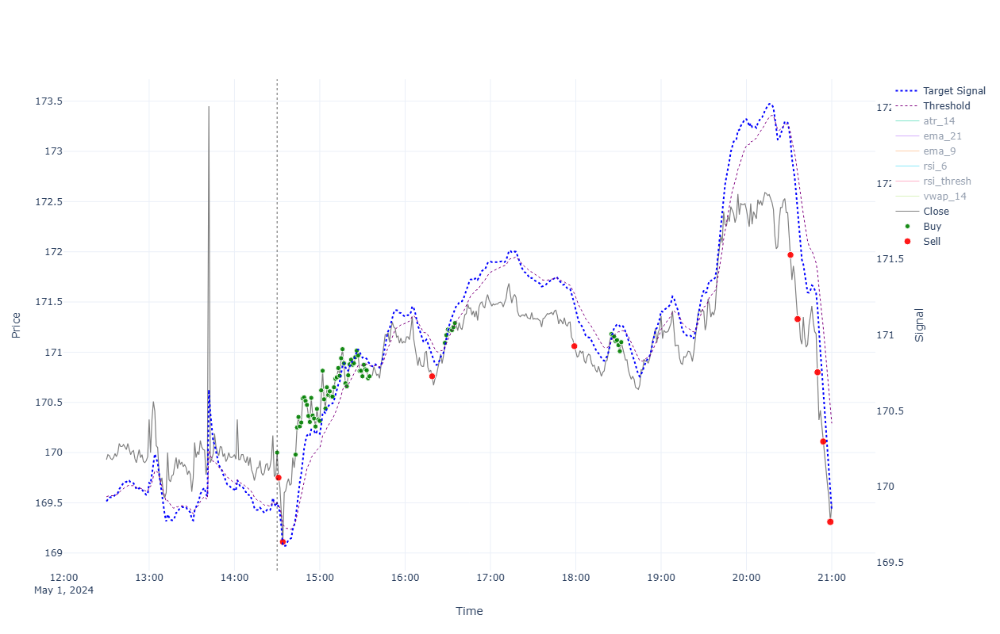


                                                  ******* Performance for 2024-05-01 *******

INTRADAY:
  shares(638); [ask_buy=170.034, fee_buy=0.004, pos_amnt_buy=108484.244]; [bid_sell=169.456, fee_sell=0.018, pos_amnt_sell=108101.58]; leftover=155.158; PNL=-382.664
TRADES:
  Tr[1]: Time(14:30)Ask(170.034)Bid(169.966)Act(Buy)Shrs(1)Pos(708); CashTr(-170.038)=Cost(-170.034)-Fee(-0.004); P&L(126769.868)=CashTot(6433.94)+PosAmt(120335.928)
  Tr[2]: Time(14:31)Ask(169.784)Bid(169.716)Act(Sell)Shrs(8)Pos(700); CashTr(1357.585)=Cost(1357.728)-Fee(-0.143); P&L(126592.76)=CashTot(7791.525)+PosAmt(118801.235)
  Tr[3]: Time(14:34)Ask(169.145)Bid(169.077)Act(Sell)Shrs(8)Pos(692); CashTr(1352.474)=Cost(1352.617)-Fee(-0.143); P&L(126145.336)=CashTot(9143.998)+PosAmt(117001.338)
  Tr[4]: Time(14:43)Ask(170.014)Bid(169.946)Act(Buy)Shrs(1)Pos(693); CashTr(-170.018)=Cost(-170.014)-Fee(-0.004); P&L(126746.561)=CashTot(8973.98)+PosAmt(117772.581)
  Tr[5]: Time(14:44)Ask(170.284)Bid(170.216)Act(Buy)Sh

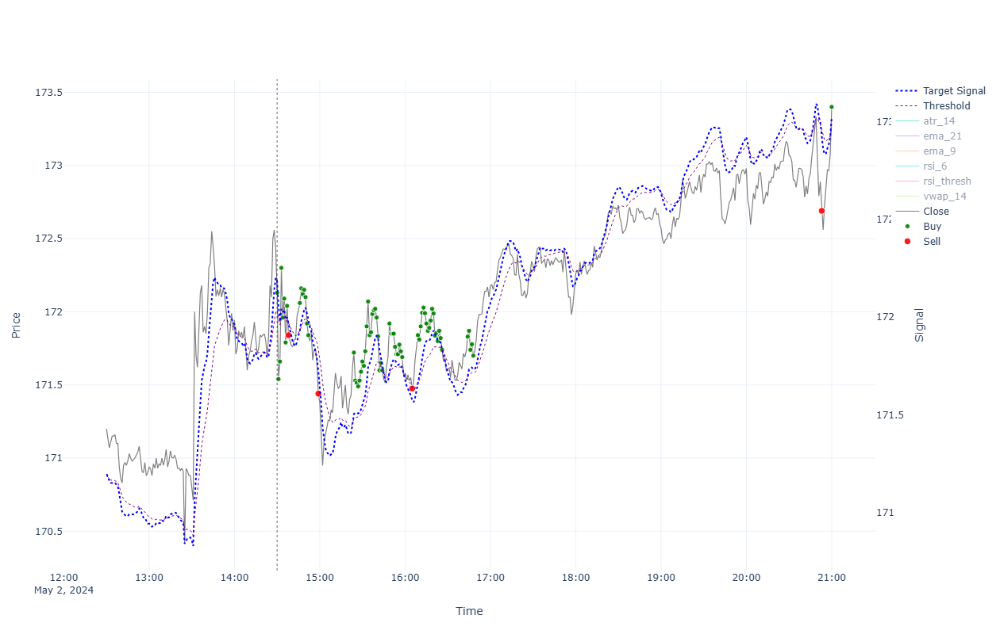


                                                  ******* Performance for 2024-05-02 *******

INTRADAY:
  shares(628); [ask_buy=172.164, fee_buy=0.004, pos_amnt_buy=108121.772]; [bid_sell=173.365, fee_sell=0.018, pos_amnt_sell=108862.13]; leftover=134.966; PNL=740.359
TRADES:
  Tr[1]: Time(14:30)Ask(172.164)Bid(172.096)Act(Buy)Shrs(1)Pos(701); CashTr(-172.168)=Cost(-172.164)-Fee(-0.004); P&L(128236.512)=CashTot(7597.515)+PosAmt(120638.997)
  Tr[2]: Time(14:31)Ask(171.574)Bid(171.506)Act(Buy)Shrs(1)Pos(702); CashTr(-171.578)=Cost(-171.574)-Fee(-0.004); P&L(127822.932)=CashTot(7425.936)+PosAmt(120396.996)
  Tr[3]: Time(14:32)Ask(171.694)Bid(171.626)Act(Buy)Shrs(1)Pos(703); CashTr(-171.698)=Cost(-171.694)-Fee(-0.004); P&L(127907.083)=CashTot(7254.238)+PosAmt(120652.845)
  Tr[4]: Time(14:33)Ask(172.334)Bid(172.266)Act(Buy)Shrs(1)Pos(704); CashTr(-172.338)=Cost(-172.334)-Fee(-0.004); P&L(128356.84)=CashTot(7081.899)+PosAmt(121274.94)
  Tr[5]: Time(14:34)Ask(171.994)Bid(171.926)Act(Buy)Shrs

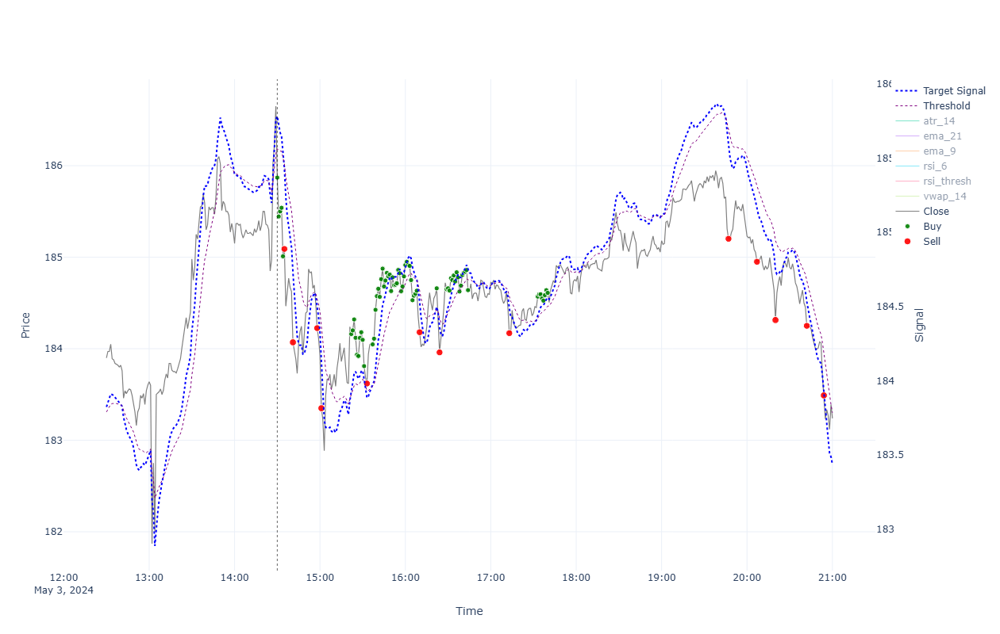


                                                  ******* Performance for 2024-05-03 *******

INTRADAY:
  shares(586); [ask_buy=185.907, fee_buy=0.004, pos_amnt_buy=108943.948]; [bid_sell=183.203, fee_sell=0.018, pos_amnt_sell=107346.086]; leftover=53.148; PNL=-1597.862
TRADES:
  Tr[1]: Time(14:30)Ask(185.907)Bid(185.833)Act(Buy)Shrs(1)Pos(739); CashTr(-185.911)=Cost(-185.907)-Fee(-0.004); P&L(138378.572)=CashTot(1048.114)+PosAmt(137330.458)
  Tr[2]: Time(14:31)Ask(185.482)Bid(185.408)Act(Buy)Shrs(1)Pos(740); CashTr(-185.486)=Cost(-185.482)-Fee(-0.004); P&L(138064.482)=CashTot(862.628)+PosAmt(137201.854)
  Tr[3]: Time(14:32)Ask(185.537)Bid(185.463)Act(Buy)Shrs(1)Pos(741); CashTr(-185.541)=Cost(-185.537)-Fee(-0.004); P&L(138105.022)=CashTot(677.087)+PosAmt(137427.935)
  Tr[4]: Time(14:33)Ask(185.577)Bid(185.503)Act(Buy)Shrs(1)Pos(742); CashTr(-185.581)=Cost(-185.577)-Fee(-0.004); P&L(138134.652)=CashTot(491.506)+PosAmt(137643.146)
  Tr[5]: Time(14:34)Ask(185.047)Bid(184.973)Act(Buy)Shr

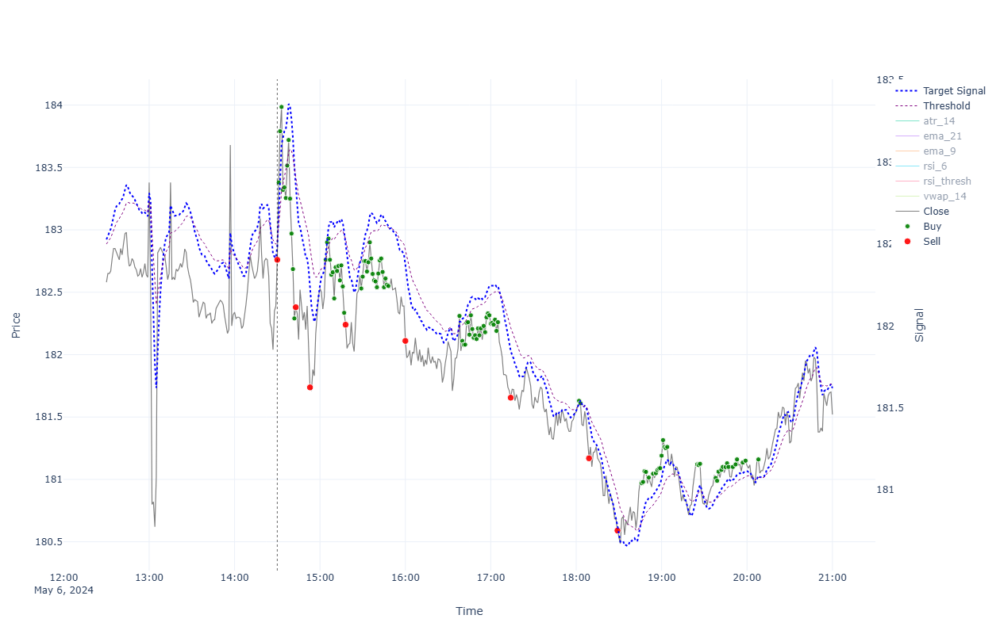


                                                  ******* Performance for 2024-05-06 *******

INTRADAY:
  shares(587); [ask_buy=182.797, fee_buy=0.004, pos_amnt_buy=107303.924]; [bid_sell=181.484, fee_sell=0.018, pos_amnt_sell=106520.267]; leftover=95.31; PNL=-783.657
TRADES:
  Tr[1]: Time(14:30)Ask(182.797)Bid(182.723)Act(Sell)Shrs(8)Pos(694); CashTr(1461.642)=Cost(1461.788)-Fee(-0.146); P&L(136095.617)=CashTot(9285.544)+PosAmt(126810.073)
  Tr[2]: Time(14:31)Ask(183.417)Bid(183.343)Act(Buy)Shrs(1)Pos(695); CashTr(-183.421)=Cost(-183.417)-Fee(-0.004); P&L(136525.734)=CashTot(9102.124)+PosAmt(127423.61)
  Tr[3]: Time(14:32)Ask(183.827)Bid(183.753)Act(Buy)Shrs(1)Pos(696); CashTr(-183.831)=Cost(-183.827)-Fee(-0.004); P&L(136810.549)=CashTot(8918.293)+PosAmt(127892.256)
  Tr[4]: Time(14:33)Ask(184.022)Bid(183.948)Act(Buy)Shrs(1)Pos(697); CashTr(-184.026)=Cost(-184.022)-Fee(-0.004); P&L(136946.165)=CashTot(8734.267)+PosAmt(128211.897)
  Tr[5]: Time(14:34)Ask(183.357)Bid(183.283)Act(Buy)Sh

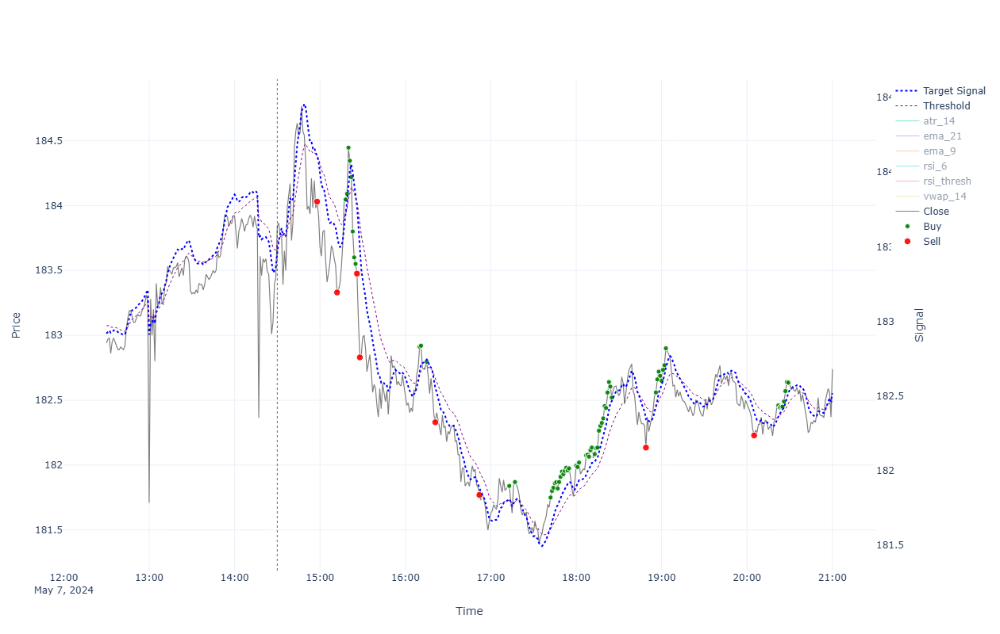


                                                  ******* Performance for 2024-05-07 *******

INTRADAY:
  shares(579); [ask_buy=183.877, fee_buy=0.004, pos_amnt_buy=106466.965]; [bid_sell=182.703, fee_sell=0.018, pos_amnt_sell=105774.765]; leftover=148.612; PNL=-692.2
TRADES:
  Tr[1]: Time(14:58)Ask(184.067)Bid(183.993)Act(Sell)Shrs(8)Pos(736); CashTr(1471.8)=Cost(1471.946)-Fee(-0.146); P&L(137037.69)=CashTot(1618.699)+PosAmt(135418.991)
  Tr[2]: Time(15:12)Ask(183.367)Bid(183.293)Act(Sell)Shrs(8)Pos(728); CashTr(1466.201)=Cost(1466.347)-Fee(-0.146); P&L(136522.447)=CashTot(3084.9)+PosAmt(133437.547)
  Tr[3]: Time(15:18)Ask(184.083)Bid(184.009)Act(Buy)Shrs(1)Pos(729); CashTr(-184.087)=Cost(-184.083)-Fee(-0.004); P&L(137043.295)=CashTot(2900.814)+PosAmt(134142.481)
  Tr[4]: Time(15:19)Ask(184.127)Bid(184.053)Act(Buy)Shrs(1)Pos(730); CashTr(-184.131)=Cost(-184.127)-Fee(-0.004); P&L(137075.433)=CashTot(2716.683)+PosAmt(134358.75)
  Tr[5]: Time(15:20)Ask(184.483)Bid(184.409)Act(Buy)Shrs(1

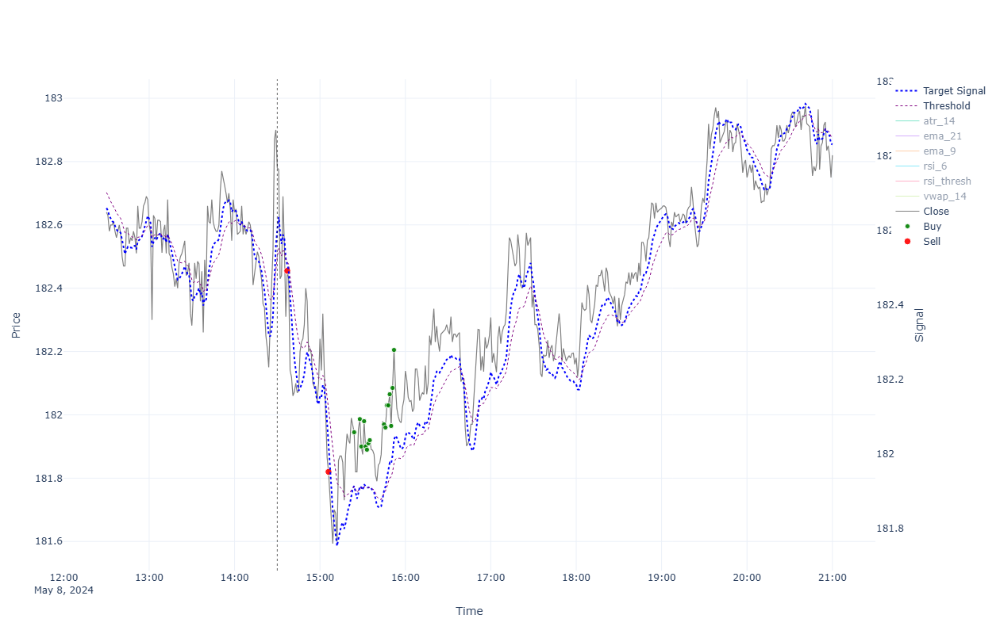


                                                  ******* Performance for 2024-05-08 *******

INTRADAY:
  shares(579); [ask_buy=182.817, fee_buy=0.004, pos_amnt_buy=105853.102]; [bid_sell=182.783, fee_sell=0.018, pos_amnt_sell=105821.075]; leftover=70.275; PNL=-32.027
TRADES:
  Tr[1]: Time(14:37)Ask(182.491)Bid(182.419)Act(Sell)Shrs(8)Pos(736); CashTr(1459.203)=Cost(1459.348)-Fee(-0.145); P&L(135877.056)=CashTot(1617.033)+PosAmt(134260.023)
  Tr[2]: Time(15:06)Ask(181.856)Bid(181.784)Act(Sell)Shrs(8)Pos(728); CashTr(1454.124)=Cost(1454.269)-Fee(-0.145); P&L(135409.644)=CashTot(3071.157)+PosAmt(132338.487)
  Tr[3]: Time(15:24)Ask(181.981)Bid(181.909)Act(Buy)Shrs(1)Pos(729); CashTr(-181.985)=Cost(-181.981)-Fee(-0.004); P&L(135500.549)=CashTot(2889.172)+PosAmt(132611.377)
  Tr[4]: Time(15:28)Ask(182.023)Bid(181.95)Act(Buy)Shrs(1)Pos(730); CashTr(-182.027)=Cost(-182.023)-Fee(-0.004); P&L(135530.793)=CashTot(2707.145)+PosAmt(132823.648)
  Tr[5]: Time(15:29)Ask(181.936)Bid(181.864)Act(Buy)S

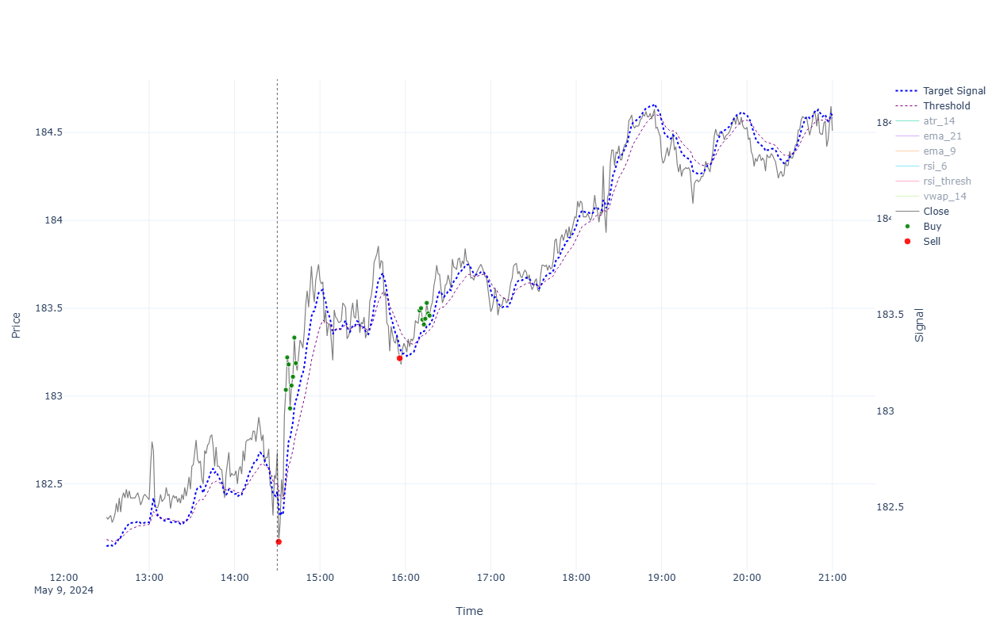


                                                  ******* Performance for 2024-05-09 *******

INTRADAY:
  shares(579); [ask_buy=182.717, fee_buy=0.004, pos_amnt_buy=105795.19]; [bid_sell=184.473, fee_sell=0.018, pos_amnt_sell=106799.367]; leftover=96.16; PNL=1004.176
TRADES:
  Tr[1]: Time(14:31)Ask(182.206)Bid(182.134)Act(Sell)Shrs(8)Pos(736); CashTr(1456.923)=Cost(1457.069)-Fee(-0.145); P&L(135665.997)=CashTot(1615.692)+PosAmt(134050.305)
  Tr[2]: Time(14:36)Ask(183.072)Bid(182.999)Act(Buy)Shrs(1)Pos(737); CashTr(-183.076)=Cost(-183.072)-Fee(-0.004); P&L(136302.727)=CashTot(1432.616)+PosAmt(134870.11)
  Tr[3]: Time(14:37)Ask(183.257)Bid(183.183)Act(Buy)Shrs(1)Pos(738); CashTr(-183.261)=Cost(-183.257)-Fee(-0.004); P&L(136438.672)=CashTot(1249.356)+PosAmt(135189.317)
  Tr[4]: Time(14:38)Ask(183.217)Bid(183.143)Act(Buy)Shrs(1)Pos(739); CashTr(-183.221)=Cost(-183.217)-Fee(-0.004); P&L(136409.081)=CashTot(1066.135)+PosAmt(135342.946)
  Tr[5]: Time(14:39)Ask(182.967)Bid(182.893)Act(Buy)Shr

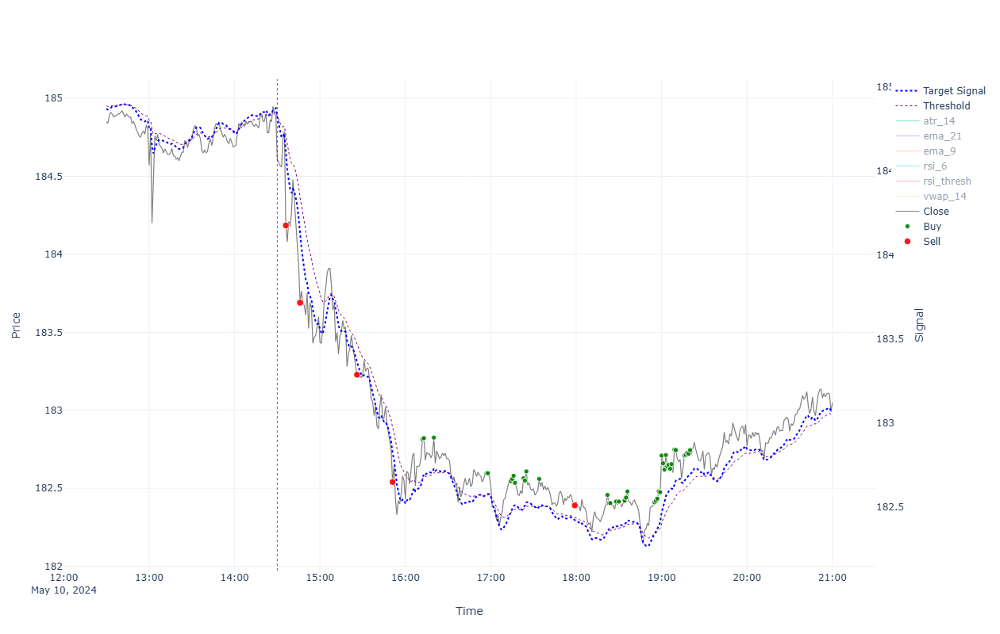


                                                  ******* Performance for 2024-05-10 *******

INTRADAY:
  shares(578); [ask_buy=184.647, fee_buy=0.004, pos_amnt_buy=106728.233]; [bid_sell=183.013, fee_sell=0.018, pos_amnt_sell=105771.22]; leftover=167.293; PNL=-957.013
TRADES:
  Tr[1]: Time(14:36)Ask(184.222)Bid(184.148)Act(Sell)Shrs(8)Pos(736); CashTr(1473.039)=Cost(1473.185)-Fee(-0.146); P&L(137153.628)=CashTot(1620.58)+PosAmt(135533.048)
  Tr[2]: Time(14:46)Ask(183.727)Bid(183.653)Act(Sell)Shrs(9)Pos(727); CashTr(1652.715)=Cost(1652.879)-Fee(-0.164); P&L(136789.217)=CashTot(3273.295)+PosAmt(133515.921)
  Tr[3]: Time(15:26)Ask(183.265)Bid(183.192)Act(Sell)Shrs(8)Pos(719); CashTr(1465.388)=Cost(1465.533)-Fee(-0.146); P&L(136453.482)=CashTot(4738.683)+PosAmt(131714.799)
  Tr[4]: Time(15:51)Ask(182.577)Bid(182.504)Act(Sell)Shrs(8)Pos(711); CashTr(1459.883)=Cost(1460.029)-Fee(-0.146); P&L(135958.62)=CashTot(6198.566)+PosAmt(129760.054)
  Tr[5]: Time(16:12)Ask(182.852)Bid(182.778)Act(Buy

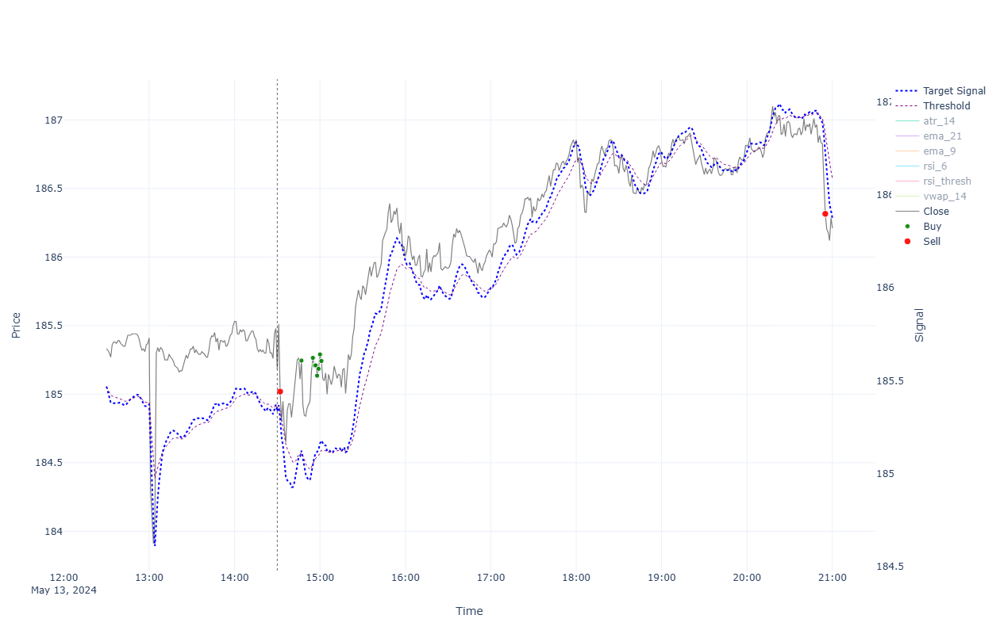


                                                  ******* Performance for 2024-05-13 *******

INTRADAY:
  shares(571); [ask_buy=185.222, fee_buy=0.004, pos_amnt_buy=105764.067]; [bid_sell=186.173, fee_sell=0.018, pos_amnt_sell=106294.211]; leftover=174.446; PNL=530.144
TRADES:
  Tr[1]: Time(14:32)Ask(185.056)Bid(184.982)Act(Sell)Shrs(8)Pos(736); CashTr(1479.711)=Cost(1479.857)-Fee(-0.146); P&L(137795.92)=CashTot(1649.097)+PosAmt(136146.823)
  Tr[2]: Time(14:47)Ask(185.282)Bid(185.208)Act(Buy)Shrs(1)Pos(737); CashTr(-185.286)=Cost(-185.282)-Fee(-0.004); P&L(137962.071)=CashTot(1463.811)+PosAmt(136498.26)
  Tr[3]: Time(14:55)Ask(185.302)Bid(185.228)Act(Buy)Shrs(1)Pos(738); CashTr(-185.306)=Cost(-185.302)-Fee(-0.004); P&L(137976.73)=CashTot(1278.505)+PosAmt(136698.225)
  Tr[4]: Time(14:56)Ask(185.247)Bid(185.173)Act(Buy)Shrs(1)Pos(739); CashTr(-185.251)=Cost(-185.247)-Fee(-0.004); P&L(137936.07)=CashTot(1093.254)+PosAmt(136842.816)
  Tr[5]: Time(14:57)Ask(185.247)Bid(185.173)Act(Buy)Shrs

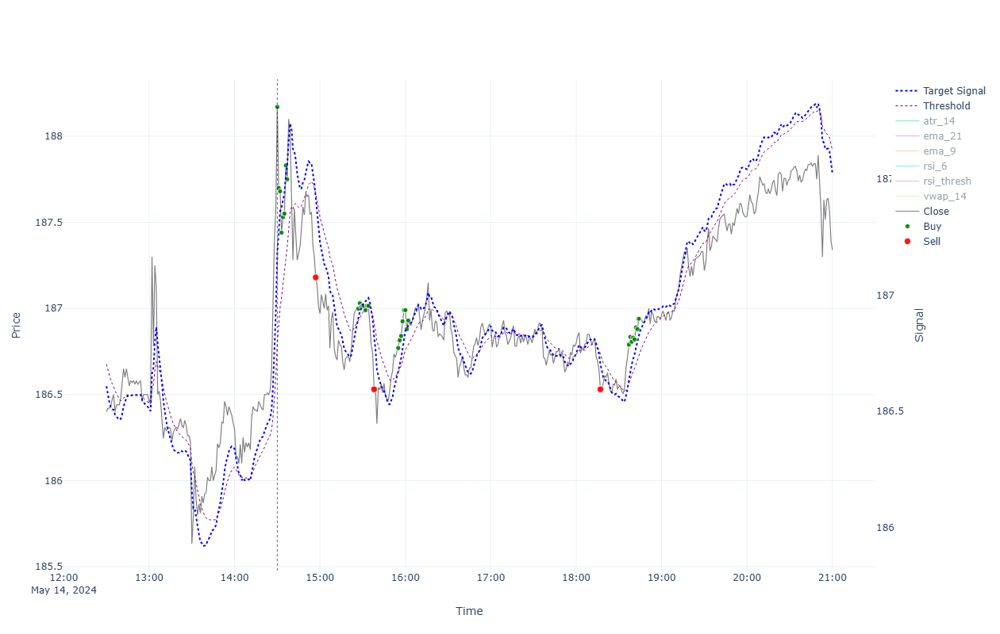


                                                  ******* Performance for 2024-05-14 *******

INTRADAY:
  shares(565); [ask_buy=188.208, fee_buy=0.004, pos_amnt_buy=106339.573]; [bid_sell=187.303, fee_sell=0.018, pos_amnt_sell=105815.592]; leftover=129.084; PNL=-523.981
TRADES:
  Tr[1]: Time(14:30)Ask(188.208)Bid(188.132)Act(Buy)Shrs(1)Pos(737); CashTr(-188.212)=Cost(-188.208)-Fee(-0.004); P&L(140122.404)=CashTot(1468.85)+PosAmt(138653.554)
  Tr[2]: Time(14:31)Ask(187.738)Bid(187.662)Act(Buy)Shrs(1)Pos(738); CashTr(-187.742)=Cost(-187.738)-Fee(-0.004); P&L(139776.004)=CashTot(1281.109)+PosAmt(138494.895)
  Tr[3]: Time(14:32)Ask(187.718)Bid(187.642)Act(Buy)Shrs(1)Pos(739); CashTr(-187.722)=Cost(-187.718)-Fee(-0.004); P&L(139761.168)=CashTot(1093.387)+PosAmt(138667.781)
  Tr[4]: Time(14:33)Ask(187.477)Bid(187.403)Act(Buy)Shrs(1)Pos(740); CashTr(-187.481)=Cost(-187.477)-Fee(-0.004); P&L(139583.765)=CashTot(905.906)+PosAmt(138677.859)
  Tr[5]: Time(14:34)Ask(187.568)Bid(187.492)Act(Buy)Sh

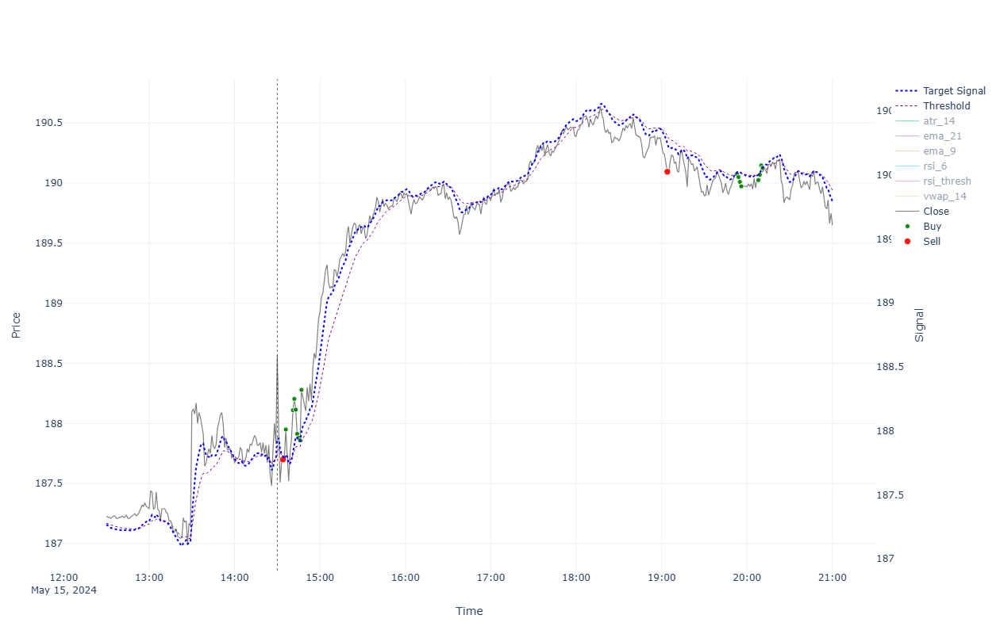


                                                  ******* Performance for 2024-05-15 *******

INTRADAY:
  shares(561); [ask_buy=188.608, fee_buy=0.004, pos_amnt_buy=105811.172]; [bid_sell=189.612, fee_sell=0.018, pos_amnt_sell=106362.076]; leftover=133.505; PNL=550.905
TRADES:
  Tr[1]: Time(14:34)Ask(187.738)Bid(187.662)Act(Sell)Shrs(8)Pos(736); CashTr(1501.153)=Cost(1501.3)-Fee(-0.146); P&L(139769.38)=CashTot(1649.81)+PosAmt(138119.571)
  Tr[2]: Time(14:36)Ask(187.988)Bid(187.912)Act(Buy)Shrs(1)Pos(737); CashTr(-187.992)=Cost(-187.988)-Fee(-0.004); P&L(139953.264)=CashTot(1461.818)+PosAmt(138491.446)
  Tr[3]: Time(14:41)Ask(188.148)Bid(188.072)Act(Buy)Shrs(1)Pos(738); CashTr(-188.152)=Cost(-188.148)-Fee(-0.004); P&L(140071.081)=CashTot(1273.666)+PosAmt(138797.415)
  Tr[4]: Time(14:42)Ask(188.243)Bid(188.167)Act(Buy)Shrs(1)Pos(739); CashTr(-188.247)=Cost(-188.243)-Fee(-0.004); P&L(140141.098)=CashTot(1085.42)+PosAmt(139055.678)
  Tr[5]: Time(14:43)Ask(188.153)Bid(188.077)Act(Buy)Shrs(

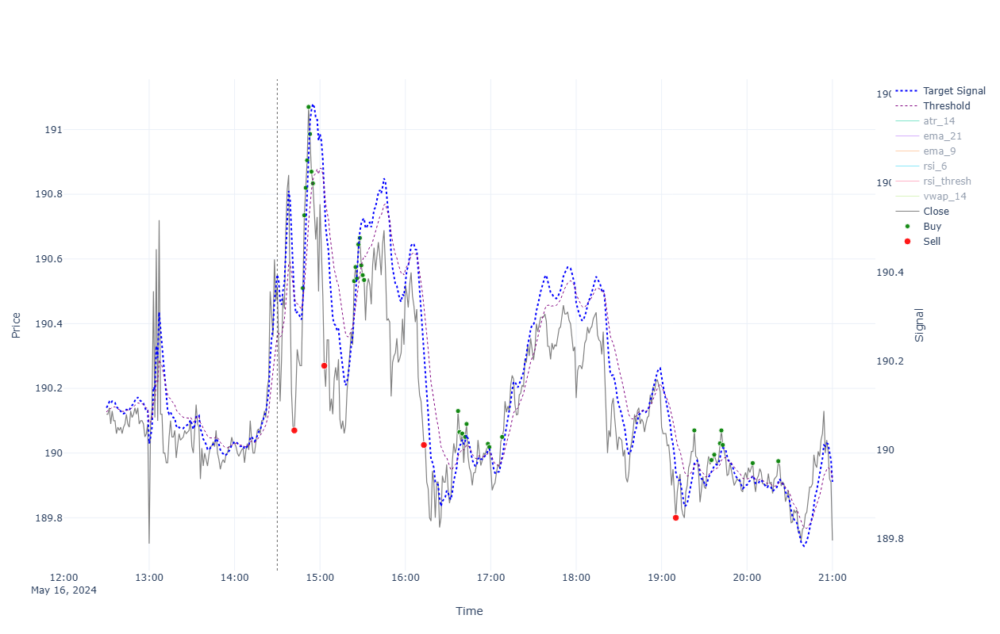


                                                  ******* Performance for 2024-05-16 *******

INTRADAY:
  shares(558); [ask_buy=190.553, fee_buy=0.004, pos_amnt_buy=106330.863]; [bid_sell=189.692, fee_sell=0.018, pos_amnt_sell=105837.925]; leftover=164.718; PNL=-492.938
TRADES:
  Tr[1]: Time(14:42)Ask(190.108)Bid(190.032)Act(Sell)Shrs(8)Pos(736); CashTr(1520.109)=Cost(1520.256)-Fee(-0.147); P&L(141528.306)=CashTot(1664.765)+PosAmt(139863.542)
  Tr[2]: Time(14:48)Ask(190.548)Bid(190.472)Act(Buy)Shrs(1)Pos(737); CashTr(-190.552)=Cost(-190.548)-Fee(-0.004); P&L(141852.001)=CashTot(1474.213)+PosAmt(140377.789)
  Tr[3]: Time(14:49)Ask(190.773)Bid(190.697)Act(Buy)Shrs(1)Pos(738); CashTr(-190.777)=Cost(-190.773)-Fee(-0.004); P&L(142017.713)=CashTot(1283.435)+PosAmt(140734.278)
  Tr[4]: Time(14:50)Ask(190.858)Bid(190.782)Act(Buy)Shrs(1)Pos(739); CashTr(-190.862)=Cost(-190.858)-Fee(-0.004); P&L(142080.35)=CashTot(1092.573)+PosAmt(140987.777)
  Tr[5]: Time(14:51)Ask(190.943)Bid(190.867)Act(Buy)

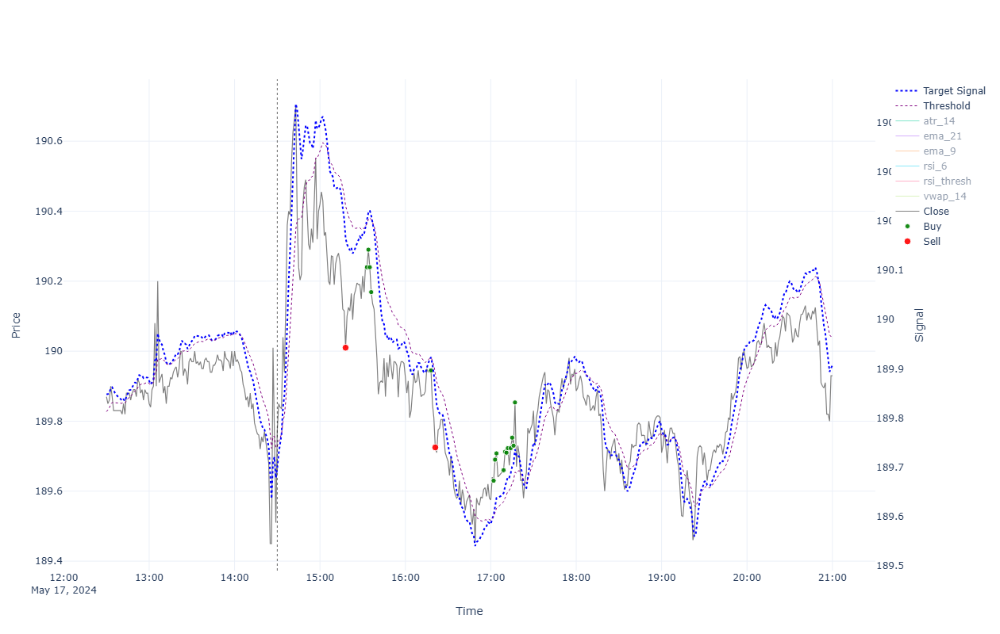


                                                  ******* Performance for 2024-05-17 *******

INTRADAY:
  shares(558); [ask_buy=189.813, fee_buy=0.004, pos_amnt_buy=105917.638]; [bid_sell=189.892, fee_sell=0.018, pos_amnt_sell=105949.5]; leftover=85.005; PNL=31.863
TRADES:
  Tr[1]: Time(15:18)Ask(190.048)Bid(189.972)Act(Sell)Shrs(8)Pos(736); CashTr(1519.629)=Cost(1519.776)-Fee(-0.147); P&L(141469.888)=CashTot(1650.497)+PosAmt(139819.391)
  Tr[2]: Time(15:33)Ask(190.278)Bid(190.202)Act(Buy)Shrs(1)Pos(737); CashTr(-190.282)=Cost(-190.278)-Fee(-0.004); P&L(141639.054)=CashTot(1460.215)+PosAmt(140178.839)
  Tr[3]: Time(15:34)Ask(190.328)Bid(190.252)Act(Buy)Shrs(1)Pos(738); CashTr(-190.332)=Cost(-190.328)-Fee(-0.004); P&L(141675.816)=CashTot(1269.883)+PosAmt(140405.933)
  Tr[4]: Time(15:35)Ask(190.278)Bid(190.202)Act(Buy)Shrs(1)Pos(739); CashTr(-190.282)=Cost(-190.278)-Fee(-0.004); P&L(141638.77)=CashTot(1079.601)+PosAmt(140559.169)
  Tr[5]: Time(15:36)Ask(190.207)Bid(190.131)Act(Buy)Shrs(

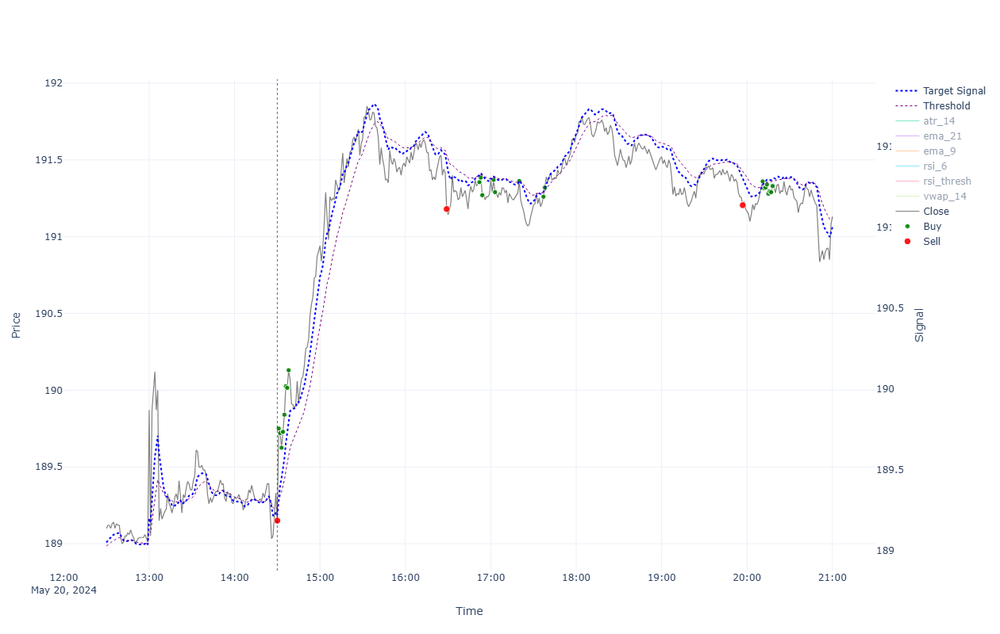


                                                  ******* Performance for 2024-05-20 *******

INTRADAY:
  shares(560); [ask_buy=189.188, fee_buy=0.004, pos_amnt_buy=105947.425]; [bid_sell=191.092, fee_sell=0.018, pos_amnt_sell=107001.098]; leftover=87.081; PNL=1053.673
TRADES:
  Tr[1]: Time(14:30)Ask(189.188)Bid(189.112)Act(Sell)Shrs(8)Pos(736); CashTr(1512.751)=Cost(1512.897)-Fee(-0.147); P&L(140828.707)=CashTot(1642.15)+PosAmt(139186.557)
  Tr[2]: Time(14:31)Ask(189.788)Bid(189.712)Act(Buy)Shrs(1)Pos(737); CashTr(-189.792)=Cost(-189.788)-Fee(-0.004); P&L(141270.139)=CashTot(1452.358)+PosAmt(139817.781)
  Tr[3]: Time(14:32)Ask(189.758)Bid(189.682)Act(Buy)Shrs(1)Pos(738); CashTr(-189.762)=Cost(-189.758)-Fee(-0.004); P&L(141247.953)=CashTot(1262.596)+PosAmt(139985.357)
  Tr[4]: Time(14:33)Ask(189.663)Bid(189.587)Act(Buy)Shrs(1)Pos(739); CashTr(-189.667)=Cost(-189.663)-Fee(-0.004); P&L(141177.778)=CashTot(1072.929)+PosAmt(140104.848)
  Tr[5]: Time(14:34)Ask(189.766)Bid(189.691)Act(Buy)S

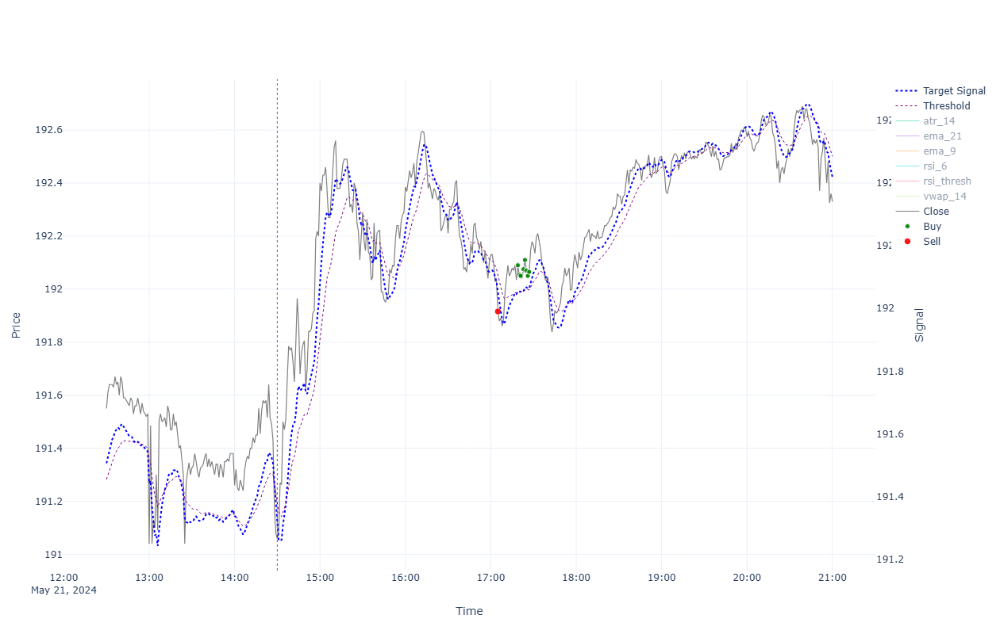


                                                  ******* Performance for 2024-05-21 *******

INTRADAY:
  shares(560); [ask_buy=191.098, fee_buy=0.004, pos_amnt_buy=107016.847]; [bid_sell=192.292, fee_sell=0.018, pos_amnt_sell=107672.948]; leftover=71.332; PNL=656.101
TRADES:
  Tr[1]: Time(17:05)Ask(191.954)Bid(191.877)Act(Sell)Shrs(8)Pos(736); CashTr(1534.871)=Cost(1535.019)-Fee(-0.147); P&L(142875.912)=CashTot(1654.207)+PosAmt(141221.705)
  Tr[2]: Time(17:19)Ask(192.128)Bid(192.051)Act(Buy)Shrs(1)Pos(737); CashTr(-192.132)=Cost(-192.128)-Fee(-0.004); P&L(143004.017)=CashTot(1462.075)+PosAmt(141541.942)
  Tr[3]: Time(17:20)Ask(192.093)Bid(192.017)Act(Buy)Shrs(1)Pos(738); CashTr(-192.097)=Cost(-192.093)-Fee(-0.004); P&L(142978.22)=CashTot(1269.977)+PosAmt(141708.243)
  Tr[4]: Time(17:21)Ask(192.088)Bid(192.012)Act(Buy)Shrs(1)Pos(739); CashTr(-192.092)=Cost(-192.088)-Fee(-0.004); P&L(142974.45)=CashTot(1077.885)+PosAmt(141896.565)
  Tr[5]: Time(17:23)Ask(192.113)Bid(192.037)Act(Buy)Shr

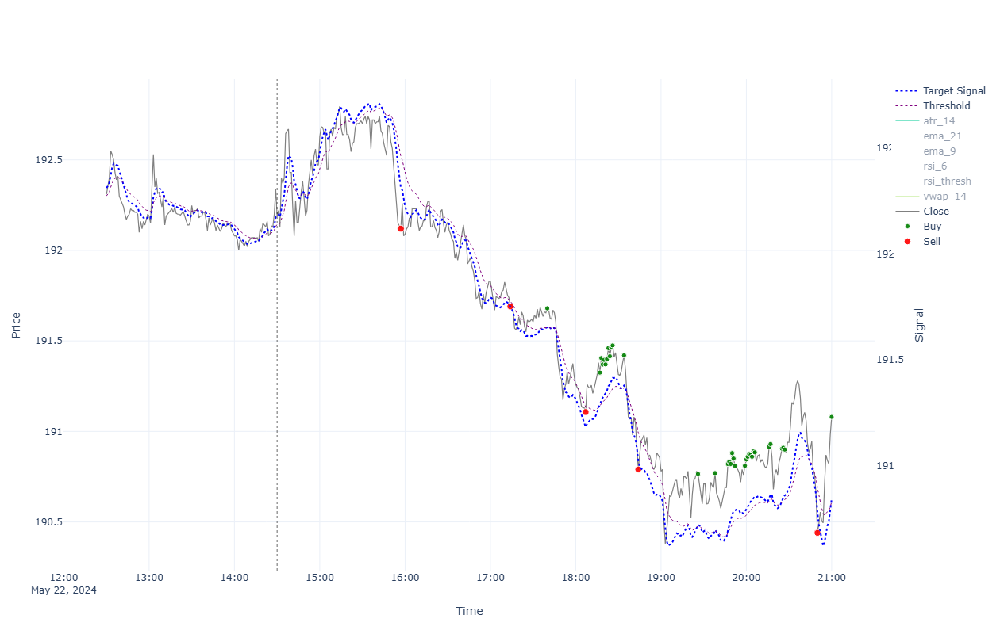


                                                  ******* Performance for 2024-05-22 *******

INTRADAY:
  shares(560); [ask_buy=192.228, fee_buy=0.004, pos_amnt_buy=107650.165]; [bid_sell=191.042, fee_sell=0.018, pos_amnt_sell=106973.104]; leftover=94.115; PNL=-677.061
TRADES:
  Tr[1]: Time(15:57)Ask(192.158)Bid(192.082)Act(Sell)Shrs(9)Pos(735); CashTr(1728.569)=Cost(1728.734)-Fee(-0.166); P&L(143025.83)=CashTot(1845.871)+PosAmt(141179.958)
  Tr[2]: Time(17:14)Ask(191.728)Bid(191.652)Act(Sell)Shrs(8)Pos(727); CashTr(1533.066)=Cost(1533.213)-Fee(-0.147); P&L(142709.696)=CashTot(3378.937)+PosAmt(139330.758)
  Tr[3]: Time(17:40)Ask(191.718)Bid(191.642)Act(Buy)Shrs(1)Pos(728); CashTr(-191.722)=Cost(-191.718)-Fee(-0.004); P&L(142702.346)=CashTot(3187.215)+PosAmt(139515.131)
  Tr[4]: Time(18:07)Ask(191.145)Bid(191.069)Act(Sell)Shrs(8)Pos(720); CashTr(1528.404)=Cost(1528.551)-Fee(-0.147); P&L(142285.212)=CashTot(4715.619)+PosAmt(137569.593)
  Tr[5]: Time(18:17)Ask(191.363)Bid(191.287)Act(Buy

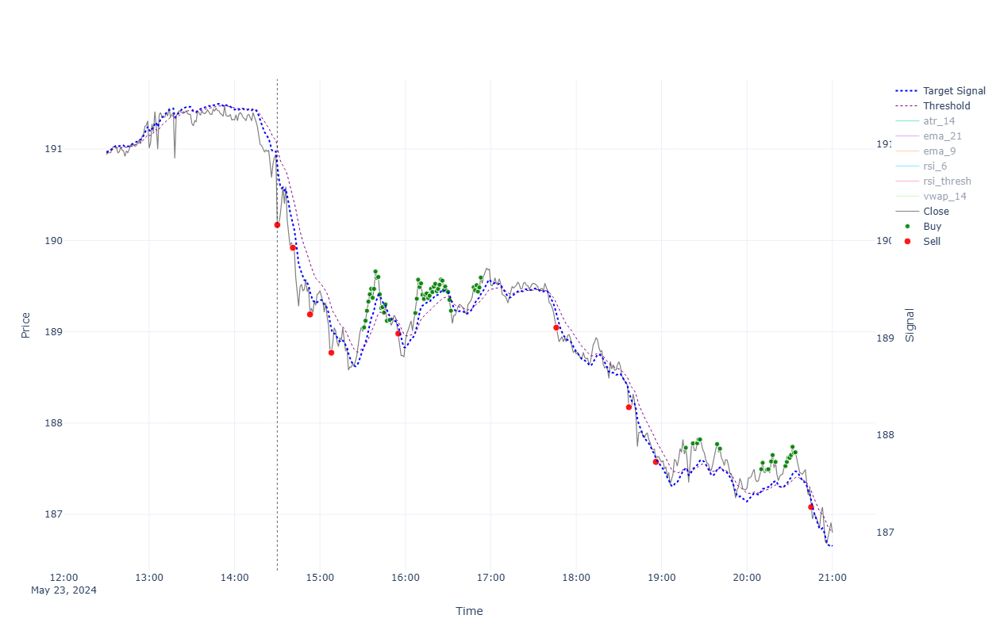


                                                  ******* Performance for 2024-05-23 *******

INTRADAY:
  shares(562); [ask_buy=190.208, fee_buy=0.004, pos_amnt_buy=106899.163]; [bid_sell=186.763, fee_sell=0.018, pos_amnt_sell=104950.327]; leftover=168.056; PNL=-1948.836
TRADES:
  Tr[1]: Time(14:30)Ask(190.208)Bid(190.132)Act(Sell)Shrs(9)Pos(728); CashTr(1711.022)=Cost(1711.188)-Fee(-0.165); P&L(141585.673)=CashTot(3169.602)+PosAmt(138416.071)
  Tr[2]: Time(14:41)Ask(189.958)Bid(189.882)Act(Sell)Shrs(9)Pos(719); CashTr(1708.773)=Cost(1708.938)-Fee(-0.165); P&L(141403.544)=CashTot(4878.375)+PosAmt(136525.17)
  Tr[3]: Time(14:53)Ask(189.228)Bid(189.152)Act(Sell)Shrs(9)Pos(710); CashTr(1702.204)=Cost(1702.369)-Fee(-0.165); P&L(140878.614)=CashTot(6580.579)+PosAmt(134298.035)
  Tr[4]: Time(15:08)Ask(188.808)Bid(188.732)Act(Sell)Shrs(8)Pos(702); CashTr(1509.711)=Cost(1509.858)-Fee(-0.147); P&L(140580.327)=CashTot(8090.29)+PosAmt(132490.037)
  Tr[5]: Time(15:31)Ask(189.086)Bid(189.01)Act(Bu

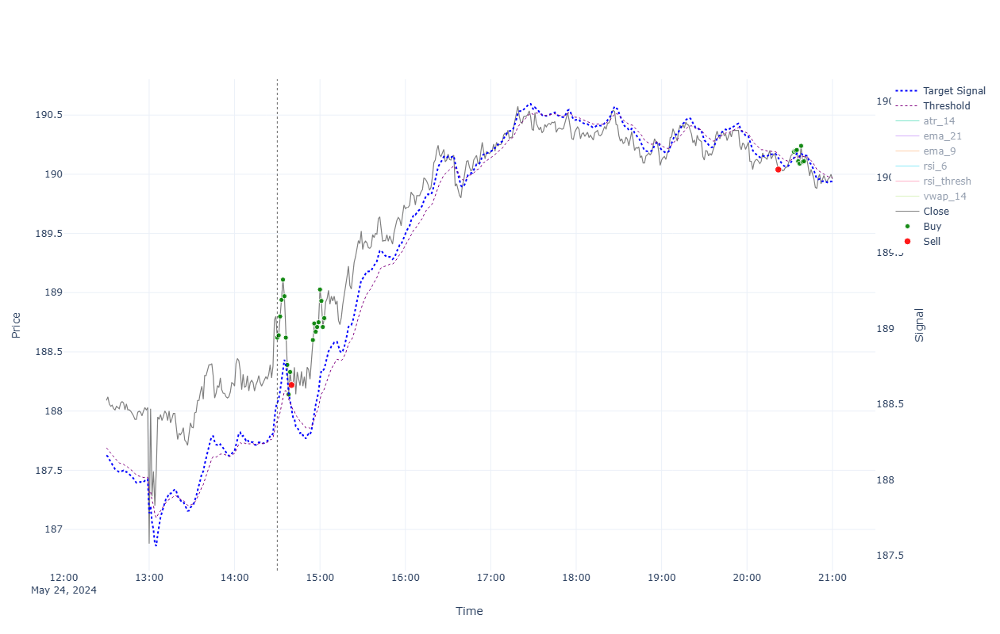


                                                  ******* Performance for 2024-05-24 *******

INTRADAY:
  shares(557); [ask_buy=188.658, fee_buy=0.004, pos_amnt_buy=105084.58]; [bid_sell=189.922, fee_sell=0.018, pos_amnt_sell=105776.333]; leftover=33.802; PNL=691.753
TRADES:
  Tr[1]: Time(14:30)Ask(188.658)Bid(188.582)Act(Buy)Shrs(1)Pos(734); CashTr(-188.662)=Cost(-188.658)-Fee(-0.004); P&L(140431.385)=CashTot(2011.995)+PosAmt(138419.391)
  Tr[2]: Time(14:31)Ask(188.678)Bid(188.602)Act(Buy)Shrs(1)Pos(735); CashTr(-188.682)=Cost(-188.678)-Fee(-0.004); P&L(140445.983)=CashTot(1823.313)+PosAmt(138622.67)
  Tr[3]: Time(14:32)Ask(188.837)Bid(188.761)Act(Buy)Shrs(1)Pos(736); CashTr(-188.841)=Cost(-188.837)-Fee(-0.004); P&L(140562.745)=CashTot(1634.472)+PosAmt(138928.273)
  Tr[4]: Time(14:33)Ask(188.977)Bid(188.902)Act(Buy)Shrs(1)Pos(737); CashTr(-188.981)=Cost(-188.977)-Fee(-0.004); P&L(140665.979)=CashTot(1445.491)+PosAmt(139220.488)
  Tr[5]: Time(14:34)Ask(189.148)Bid(189.072)Act(Buy)Shrs

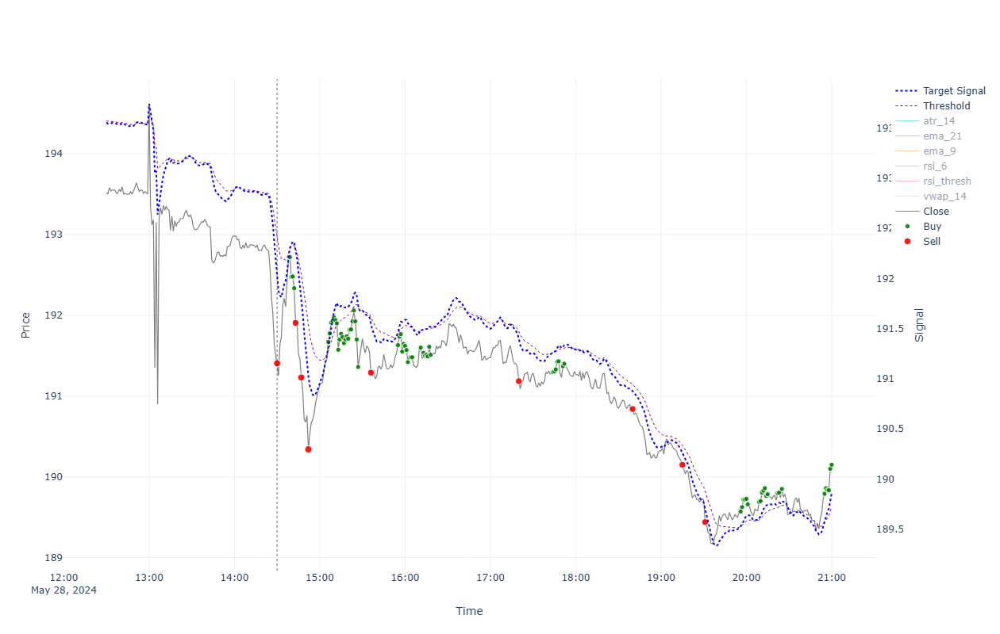


                                                  ******* Performance for 2024-05-28 *******

INTRADAY:
  shares(552); [ask_buy=191.443, fee_buy=0.004, pos_amnt_buy=105678.899]; [bid_sell=190.112, fee_sell=0.018, pos_amnt_sell=104931.671]; leftover=131.236; PNL=-747.228
TRADES:
  Tr[1]: Time(14:30)Ask(191.443)Bid(191.367)Act(Sell)Shrs(9)Pos(735); CashTr(1722.135)=Cost(1722.3)-Fee(-0.166); P&L(142494.652)=CashTot(1840.113)+PosAmt(140654.538)
  Tr[2]: Time(14:39)Ask(192.759)Bid(192.681)Act(Buy)Shrs(1)Pos(736); CashTr(-192.763)=Cost(-192.759)-Fee(-0.004); P&L(143460.902)=CashTot(1647.351)+PosAmt(141813.552)
  Tr[3]: Time(14:40)Ask(192.513)Bid(192.437)Act(Buy)Shrs(1)Pos(737); CashTr(-192.517)=Cost(-192.513)-Fee(-0.004); P&L(143280.538)=CashTot(1454.833)+PosAmt(141825.704)
  Tr[4]: Time(14:41)Ask(192.518)Bid(192.442)Act(Buy)Shrs(1)Pos(738); CashTr(-192.522)=Cost(-192.518)-Fee(-0.004); P&L(143284.141)=CashTot(1262.311)+PosAmt(142021.83)
  Tr[5]: Time(14:42)Ask(192.373)Bid(192.297)Act(Buy)Sh

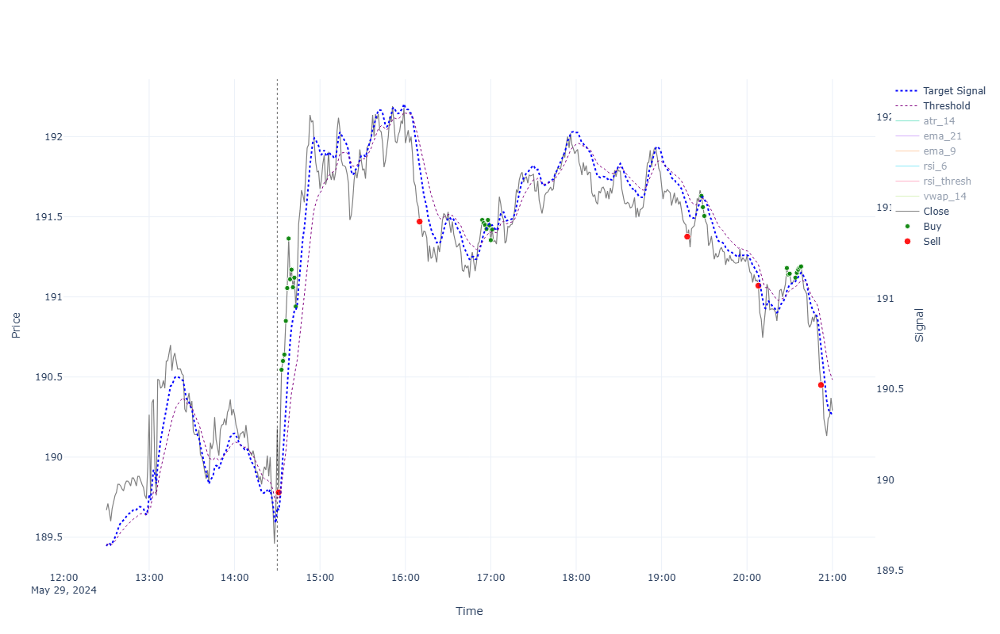


                                                  ******* Performance for 2024-05-29 *******

INTRADAY:
  shares(552); [ask_buy=190.218, fee_buy=0.004, pos_amnt_buy=105002.564]; [bid_sell=190.252, fee_sell=0.018, pos_amnt_sell=105008.934]; leftover=60.344; PNL=6.37
TRADES:
  Tr[1]: Time(14:31)Ask(189.818)Bid(189.742)Act(Sell)Shrs(8)Pos(733); CashTr(1517.79)=Cost(1517.936)-Fee(-0.147); P&L(141262.443)=CashTot(2181.525)+PosAmt(139080.918)
  Tr[2]: Time(14:33)Ask(190.583)Bid(190.507)Act(Buy)Shrs(1)Pos(734); CashTr(-190.587)=Cost(-190.583)-Fee(-0.004); P&L(141822.995)=CashTot(1990.937)+PosAmt(139832.058)
  Tr[3]: Time(14:34)Ask(190.638)Bid(190.562)Act(Buy)Shrs(1)Pos(735); CashTr(-190.642)=Cost(-190.638)-Fee(-0.004); P&L(141863.277)=CashTot(1800.295)+PosAmt(140062.982)
  Tr[4]: Time(14:35)Ask(190.678)Bid(190.602)Act(Buy)Shrs(1)Pos(736); CashTr(-190.682)=Cost(-190.678)-Fee(-0.004); P&L(141892.591)=CashTot(1609.613)+PosAmt(140282.978)
  Tr[5]: Time(14:36)Ask(190.888)Bid(190.812)Act(Buy)Shrs(

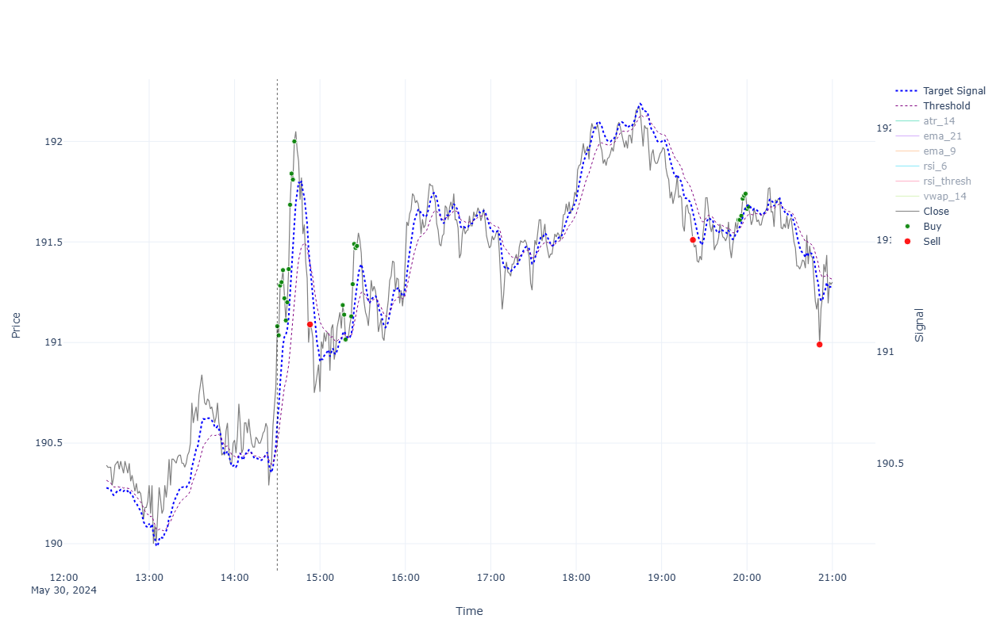


                                                  ******* Performance for 2024-05-30 *******

INTRADAY:
  shares(549); [ask_buy=191.119, fee_buy=0.004, pos_amnt_buy=104926.701]; [bid_sell=191.262, fee_sell=0.018, pos_amnt_sell=104992.6]; leftover=142.577; PNL=65.899
TRADES:
  Tr[1]: Time(14:30)Ask(191.119)Bid(191.043)Act(Buy)Shrs(1)Pos(732); CashTr(-191.123)=Cost(-191.119)-Fee(-0.004); P&L(142209.701)=CashTot(2366.31)+PosAmt(139843.391)
  Tr[2]: Time(14:31)Ask(191.074)Bid(190.998)Act(Buy)Shrs(1)Pos(733); CashTr(-191.078)=Cost(-191.074)-Fee(-0.004); P&L(142176.541)=CashTot(2175.232)+PosAmt(140001.309)
  Tr[3]: Time(14:32)Ask(191.322)Bid(191.245)Act(Buy)Shrs(1)Pos(734); CashTr(-191.326)=Cost(-191.322)-Fee(-0.004); P&L(142357.915)=CashTot(1983.906)+PosAmt(140374.009)
  Tr[4]: Time(14:33)Ask(191.338)Bid(191.262)Act(Buy)Shrs(1)Pos(735); CashTr(-191.342)=Cost(-191.338)-Fee(-0.004); P&L(142369.943)=CashTot(1792.564)+PosAmt(140577.379)
  Tr[5]: Time(14:34)Ask(191.398)Bid(191.322)Act(Buy)Shrs(

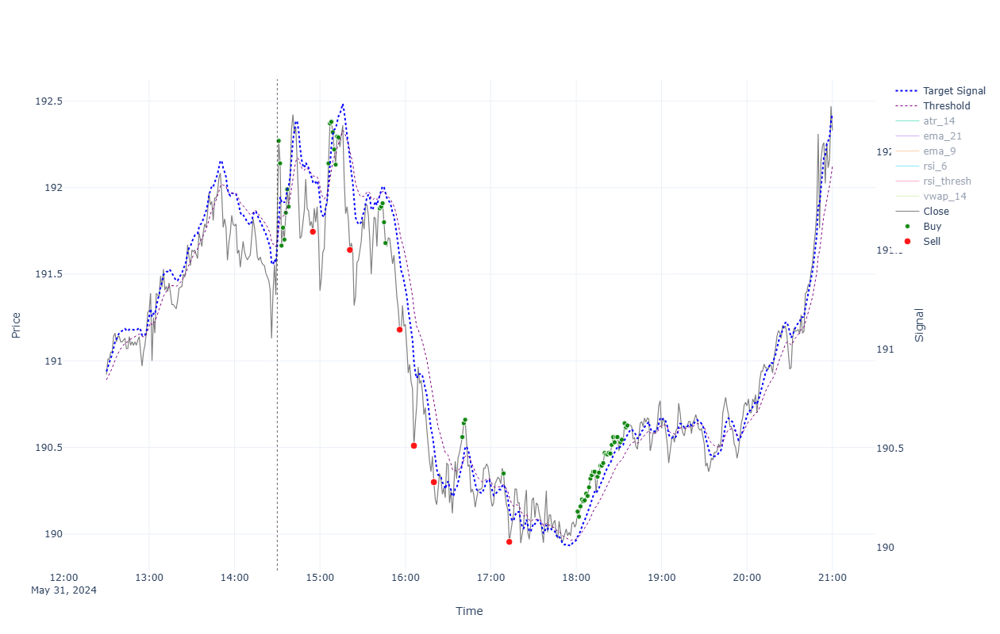


                                                  ******* Performance for 2024-05-31 *******

INTRADAY:
  shares(547); [ask_buy=191.933, fee_buy=0.004, pos_amnt_buy=104989.746]; [bid_sell=192.292, fee_sell=0.018, pos_amnt_sell=105173.397]; leftover=145.43; PNL=183.651
TRADES:
  Tr[1]: Time(14:31)Ask(192.308)Bid(192.232)Act(Buy)Shrs(1)Pos(737); CashTr(-192.312)=Cost(-192.308)-Fee(-0.004); P&L(143074.04)=CashTot(1399.39)+PosAmt(141674.649)
  Tr[2]: Time(14:32)Ask(192.178)Bid(192.102)Act(Buy)Shrs(1)Pos(738); CashTr(-192.182)=Cost(-192.178)-Fee(-0.004); P&L(142978.168)=CashTot(1207.208)+PosAmt(141770.96)
  Tr[3]: Time(14:33)Ask(191.703)Bid(191.627)Act(Buy)Shrs(1)Pos(739); CashTr(-191.707)=Cost(-191.703)-Fee(-0.004); P&L(142627.608)=CashTot(1015.501)+PosAmt(141612.107)
  Tr[4]: Time(14:34)Ask(191.807)Bid(191.731)Act(Buy)Shrs(1)Pos(740); CashTr(-191.811)=Cost(-191.807)-Fee(-0.004); P&L(142704.294)=CashTot(823.689)+PosAmt(141880.604)
  Tr[5]: Time(14:35)Ask(191.738)Bid(191.662)Act(Buy)Shrs(1

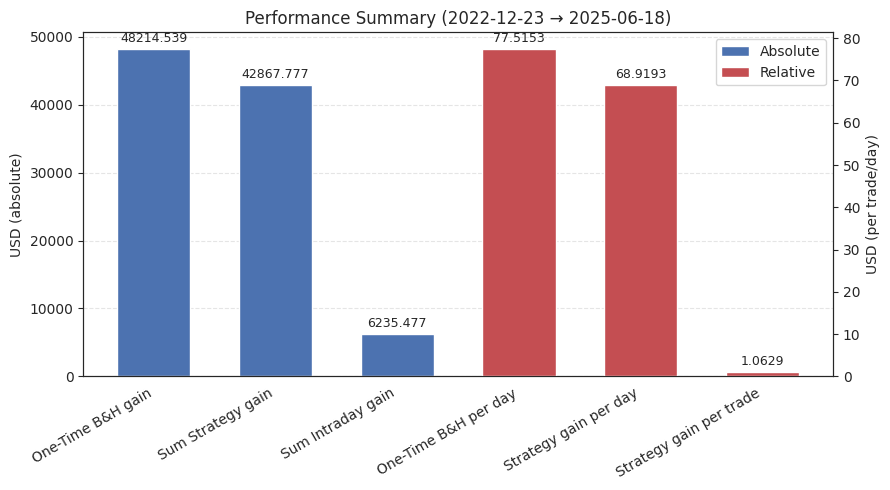

Rolling monthly summary (each metric carries its own capital forward):

Monthly Summary 2022-12 (2022-12-23 = 132.533 → 2022-12-30 = 129.814)
Num. trading days: 5  Trades Count: 766
One-Time B&H gain: -2066.049 | start: 100000.000 | final: 97933.951 | PnL%: -2.07%
Sum Strategy gain: -2378.814 | start: 100000.000 | final: 97621.186 | PnL%: -2.38%
Sum Intraday gain: -1097.078 | start: 100000.000 | final: 98902.922 | PnL%: -1.10%

Monthly Summary 2023-01 (2023-01-03 = 129.814 → 2023-01-31 = 144.151)
Num. trading days: 20  Trades Count: 1790
One-Time B&H gain: 10809.949 | start: 97933.951 | final: 108743.900 | PnL%: 11.04%
Sum Strategy gain: 11644.913 | start: 97621.186 | final: 109266.099 | PnL%: 11.93%
Sum Intraday gain: 9380.434 | start: 98902.922 | final: 108283.356 | PnL%: 9.48%

Monthly Summary 2023-02 (2023-02-01 = 144.151 → 2023-02-28 = 147.361)
Num. trading days: 19  Trades Count: 1607
One-Time B&H gain: 2419.801 | start: 108743.900 | final: 111163.701 | PnL%: 2.23%
Sum Strategy g

In [5]:
importlib.reload(params) ######
# importlib.reload(strategies) ######

year, month = map(int, params.month_to_check.split("-"))
dates_in_month = [date for date in sim_results if date.year == year and date.month == month]

if not dates_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for date in sorted(dates_in_month):
        df_at_date_plot, trades_at_date, stats_at_date = sim_results[date]
        plots.plot_trades(
            df                 = df_at_date_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            trades             = trades_at_date,
            performance_stats  = stats_at_date,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            start_plot         = params.sess_start_shift,
            autoscale          = False
        )
        
        print(f"\n{' ' * 50}******* Performance for {date.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_at_date.items(): # Print stats dict for each date nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "-"*150 + "\n")

# final visualizations and monthly aggregations
strategies.aggregate_performance(df = df_inds_test,
                                 sim_results = sim_results,
                                 sess_start = sess_start)
